In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import files
files.upload()

Saving synset_words.txt to synset_words.txt


{'synset_words.txt': b"n01440764 tench, Tinca tinca\nn01443537 goldfish, Carassius auratus\nn01484850 great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias\nn01491361 tiger shark, Galeocerdo cuvieri\nn01494475 hammerhead, hammerhead shark\nn01496331 electric ray, crampfish, numbfish, torpedo\nn01498041 stingray\nn01514668 cock\nn01514859 hen\nn01518878 ostrich, Struthio camelus\nn01530575 brambling, Fringilla montifringilla\nn01531178 goldfinch, Carduelis carduelis\nn01532829 house finch, linnet, Carpodacus mexicanus\nn01534433 junco, snowbird\nn01537544 indigo bunting, indigo finch, indigo bird, Passerina cyanea\nn01558993 robin, American robin, Turdus migratorius\nn01560419 bulbul\nn01580077 jay\nn01582220 magpie\nn01592084 chickadee\nn01601694 water ouzel, dipper\nn01608432 kite\nn01614925 bald eagle, American eagle, Haliaeetus leucocephalus\nn01616318 vulture\nn01622779 great grey owl, great gray owl, Strix nebulosa\nn01629819 European fire salamander,

In [ ]:
!pip install termtables

In [ ]:
!pip install pydicom

In [ ]:
!unzip ./drive/MyDrive/torch_project/medi/chexnet/rsna-pneumonia-detection-challenge.zip

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
  inflating: stage_2_train_images/d5231546-354e-4071-9af1-6644beabfd86.dcm  
  inflating: stage_2_train_images/d5252a78-3ea1-48e9-9ffb-e7535be3ce80.dcm  
  inflating: stage_2_train_images/d525eafb-8908-45fd-a942-48d07c435487.dcm  
  inflating: stage_2_train_images/d5265640-17db-4880-866d-d2952e32941c.dcm  
  inflating: stage_2_train_images/d5277276-f8f8-40e9-b8e1-791cf5d96ac0.dcm  
  inflating: stage_2_train_images/d528d9e9-647a-4e2e-a16c-bd5e32a5bbf5.dcm  
  inflating: stage_2_train_images/d5293a3e-f050-4b98-8bbf-1f40e25bced5.dcm  
  inflating: stage_2_train_images/d52cbb5a-1d0a-457d-8c72-0f7aeec21ca7.dcm  
  inflating: stage_2_train_images/d52ce67b-be7c-4349-8dc4-38562928d208.dcm  
  inflating: stage_2_train_images/d535a3c8-c4a4-4856-b5cd-17f6332eac8b.dcm  
  inflating: stage_2_train_images/d5360dc4-6bea-4a7b-bc49-5b2547ad7877.dcm  
  inflating: stage_2_train_images/d5364bc1-bc2a-4bd0-a1bd-0cfb5a369ccc.dcm  
  inflating: stage_2_train_images/d539e1

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pylab as plt
import pydicom
import os
from os import listdir
from os.path import isfile, join
import glob, pylab

import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from PIL import Image
from tqdm import tqdm
import termtables as tt
import torch.nn as nn
import torchvision
import shutil 
import datetime
import json
import torch.backends.cudnn as cudnn
from torch import optim
from torch.utils.data.distributed import DistributedSampler
from torch.utils.data import DataLoader
from sklearn.metrics import roc_auc_score, confusion_matrix, roc_curve, auc, f1_score
import seaborn as sn
from scipy import interp
from itertools import cycle
import matplotlib
from collections import OrderedDict
import random
from skimage.transform import resize
import torch.utils.data
import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models
from torch.utils.data.sampler import Sampler

# EDA

In [ ]:
# Images Example
train_images_dir = './stage_2_train_images/'
train_images = [f for f in listdir(train_images_dir) if isfile(join(train_images_dir, f))]
test_images_dir = './stage_2_test_images/'
test_images = [f for f in listdir(test_images_dir) if isfile(join(test_images_dir, f))]
print('5 Training images', train_images[:5]) # Print the first 5
print('Number of train images:', len(train_images))
print('Number of test images:', len(test_images))

5 Training images ['9aa71e73-be35-4de7-8709-a3c53b936db1.dcm', 'c7e7ac26-07bd-4fad-854d-a99270add377.dcm', '3e9dc5b9-1b7a-4e9f-a8aa-d28fc622f595.dcm', '0124882b-de2f-4023-985f-debb74aa6ebb.dcm', 'b1ebd57e-6037-42a0-9e31-612968c4ff92.dcm']
Number of train images: 26684
Number of test images: 3000


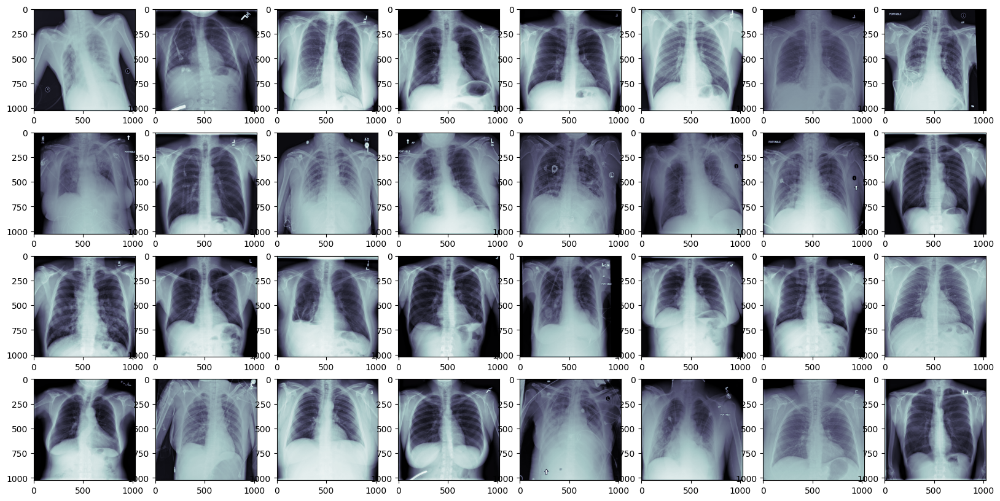

In [ ]:
plt.style.use('default')
fig=plt.figure(figsize=(20, 10))
columns = 8; rows = 4
for i in range(1, columns*rows +1):
    ds = pydicom.dcmread(train_images_dir + train_images[i])
    fig.add_subplot(rows, columns, i)
    plt.imshow(ds.pixel_array, cmap=plt.cm.bone)
    fig.add_subplot

In [ ]:
train_labels = pd.read_csv('./stage_2_train_labels.csv')
train_labels.head()

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1


In [ ]:
# Number of positive targets
print(round((8964 / (8964 + 20025)) * 100, 2), '% of the examples are positive')
pd.DataFrame(train_labels.groupby('Target')['patientId'].count())

30.92 % of the examples are positive


,patientId
Target,
0,20672
1,9555


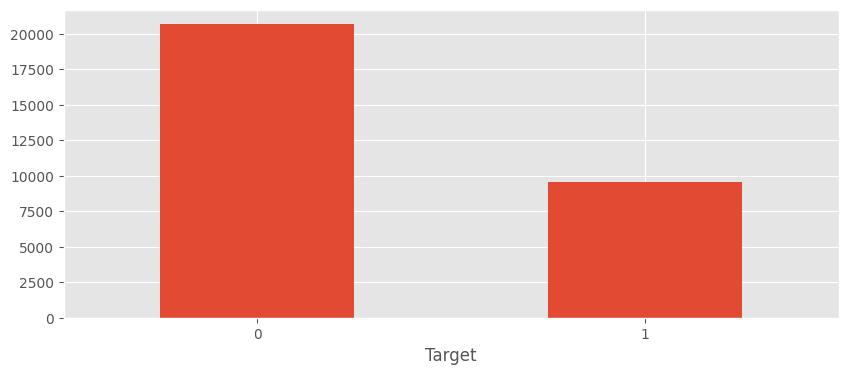

In [ ]:
# Distribution of Target in Training Set
plt.style.use('ggplot')
plot = train_labels.groupby('Target') \
    .count()['patientId'] \
    .plot(kind='bar', figsize=(10,4), rot=0)

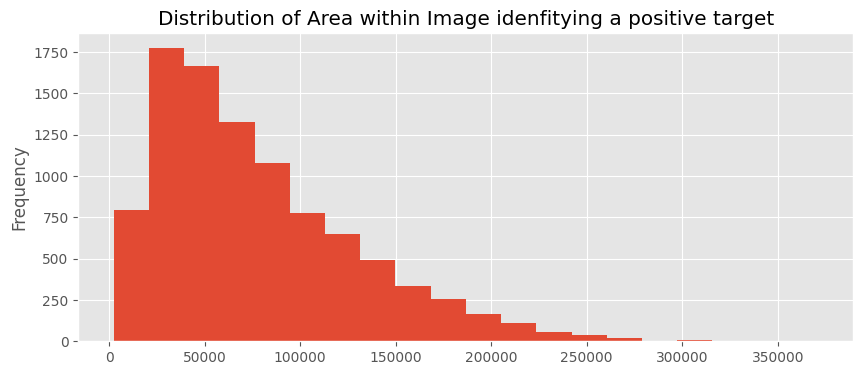

In [ ]:
plt.style.use('ggplot')
train_labels['area'] = train_labels['width'] * train_labels['height']
plot = train_labels['area'].plot(kind='hist',
                          figsize=(10,4),
                          bins=20,
                          title='Distribution of Area within Image idenfitying a positive target')

In [ ]:
def parse_data(df):
    """
    Method to read a CSV file (Pandas dataframe) and parse the 
    data into the following nested dictionary:

      parsed = {
        
        'patientId-00': {
            'dicom': path/to/dicom/file,
            'label': either 0 or 1 for normal or pnuemonia, 
            'boxes': list of box(es)
        },
        'patientId-01': {
            'dicom': path/to/dicom/file,
            'label': either 0 or 1 for normal or pnuemonia, 
            'boxes': list of box(es)
        }, ...

      }

    """
    # --- Define lambda to extract coords in list [y, x, height, width]
    extract_box = lambda row: [row['y'], row['x'], row['height'], row['width']]

    parsed = {}
    for n, row in df.iterrows():
        # --- Initialize patient entry into parsed 
        pid = row['patientId']
        if pid not in parsed:
            parsed[pid] = {
                'dicom': './stage_2_train_images/%s.dcm' % pid,
                'label': row['Target'],
                'boxes': []}

        # --- Add box if opacity is present
        if parsed[pid]['label'] == 1:
            parsed[pid]['boxes'].append(extract_box(row))

    return parsed

def draw(data):
    """
    Method to draw single patient with bounding box(es) if present 

    """
    # --- Open DICOM file
    d = pydicom.read_file(data['dicom'])
    im = d.pixel_array

    # --- Convert from single-channel grayscale to 3-channel RGB
    im = np.stack([im] * 3, axis=2)

    # --- Add boxes with random color if present
    for box in data['boxes']:
        rgb = np.floor(np.random.rand(3) * 256).astype('int')
        im = overlay_box(im=im, box=box, rgb=rgb, stroke=6)

    pylab.imshow(im, cmap=pylab.cm.gist_gray)
    pylab.axis('off')

def overlay_box(im, box, rgb, stroke=1):
    """
    Method to overlay single box on image

    """
    # --- Convert coordinates to integers
    box = [int(b) for b in box]
    
    # --- Extract coordinates
    y1, x1, height, width = box
    y2 = y1 + height
    x2 = x1 + width

    im[y1:y1 + stroke, x1:x2] = rgb
    im[y2:y2 + stroke, x1:x2] = rgb
    im[y1:y2, x1:x1 + stroke] = rgb
    im[y1:y2, x2:x2 + stroke] = rgb

    return im

parsed = parse_data(train_labels)

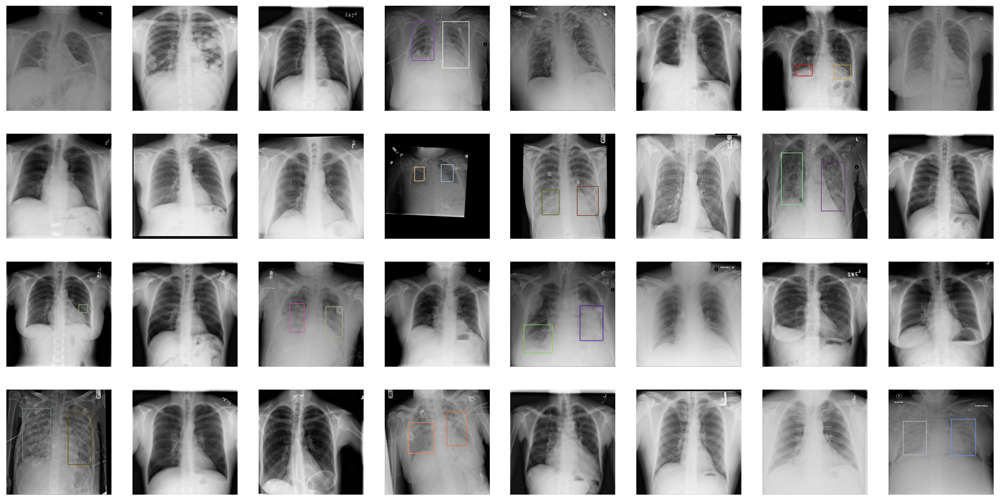

In [ ]:
plt.style.use('default')
fig=plt.figure(figsize=(20, 10))
columns = 8; rows = 4
for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    draw(parsed[train_labels['patientId'].unique()[i]])
    fig.add_subplot

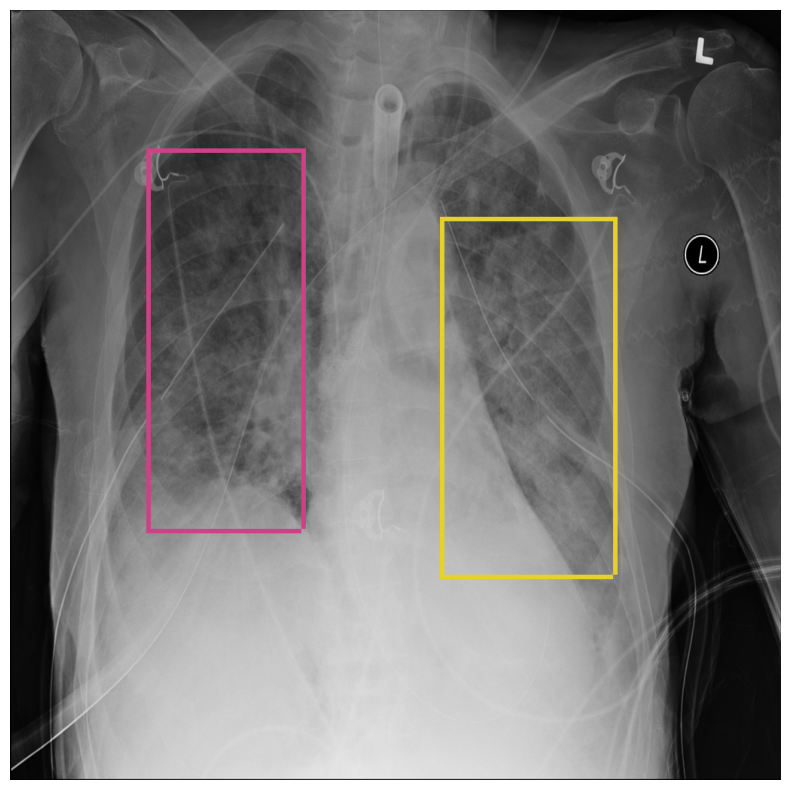

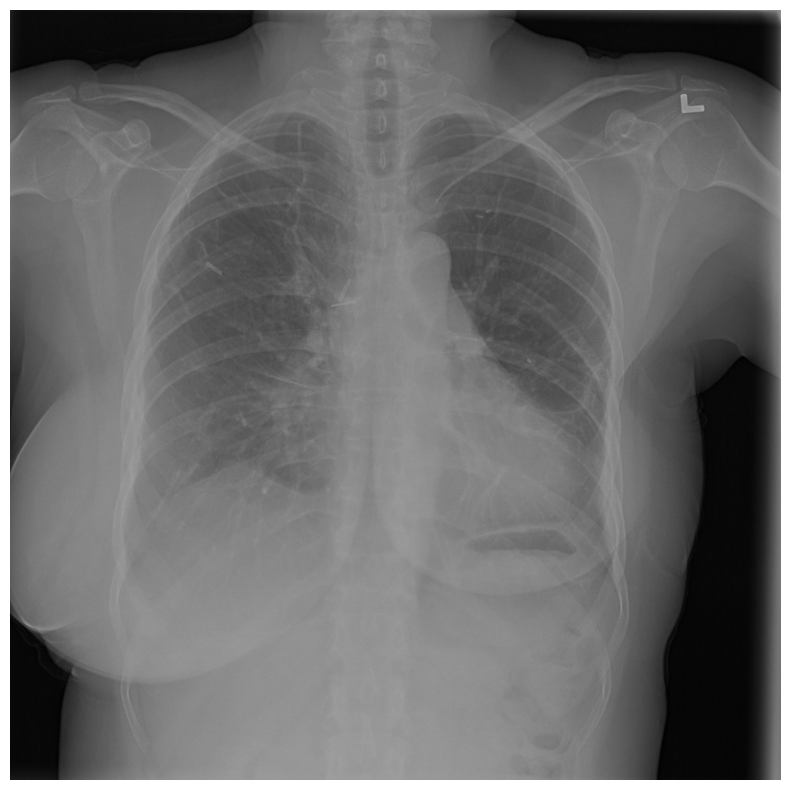

In [ ]:
fig=plt.figure(figsize=(20, 10))
draw(parsed[train_labels['patientId'].loc[20]])
plt.show()
fig=plt.figure(figsize=(20, 10))
draw(parsed[train_labels['patientId'].loc[10]])
plt.show()

In [ ]:
detailed_class_info = pd.read_csv('./stage_2_detailed_class_info.csv')
detailed_class_info.groupby('class').count()

,patientId
class,
Lung Opacity,9555
No Lung Opacity / Not Normal,11821
Normal,8851


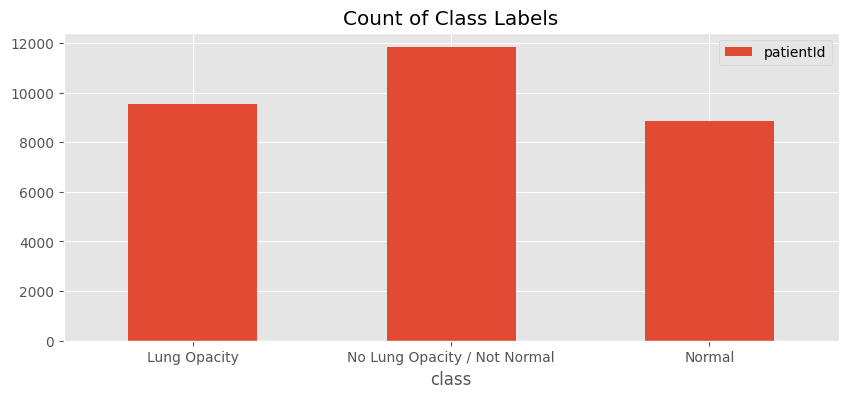

In [ ]:
plt.style.use('ggplot')
plot = detailed_class_info.groupby('class').count().plot(kind='bar',
                                                  rot=0,
                                                  title='Count of Class Labels',
                                                  figsize=(10,4))

In [ ]:
count_labels_per_patient = detailed_class_info.groupby('patientId').count()

In [ ]:
opacity = detailed_class_info \
    .loc[detailed_class_info['class'] == 'Lung Opacity'] \
    .reset_index()
not_normal = detailed_class_info \
    .loc[detailed_class_info['class'] == 'No Lung Opacity / Not Normal'] \
    .reset_index()
normal = detailed_class_info \
    .loc[detailed_class_info['class'] == 'Normal'] \
    .reset_index()

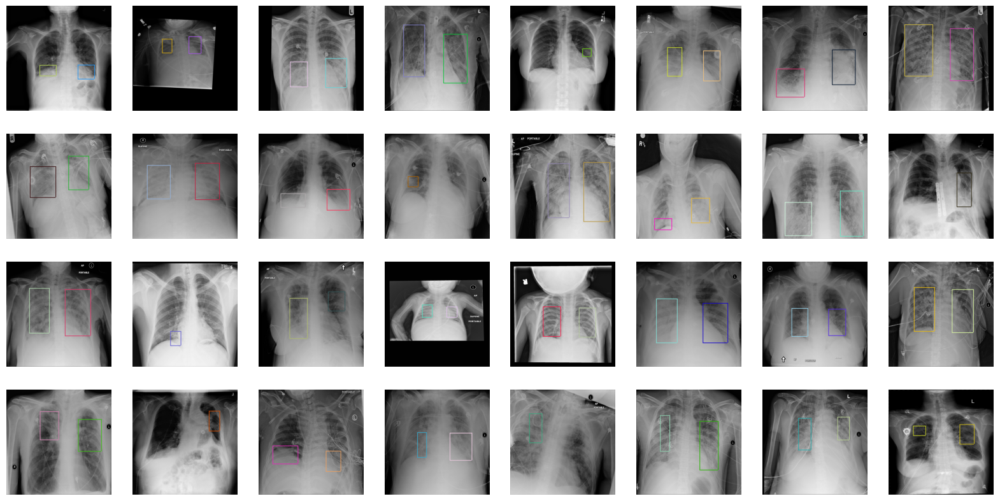

In [ ]:
plt.style.use('default')
fig=plt.figure(figsize=(20, 10))
columns = 8; rows = 4
for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    draw(parsed[opacity['patientId'].unique()[i]])

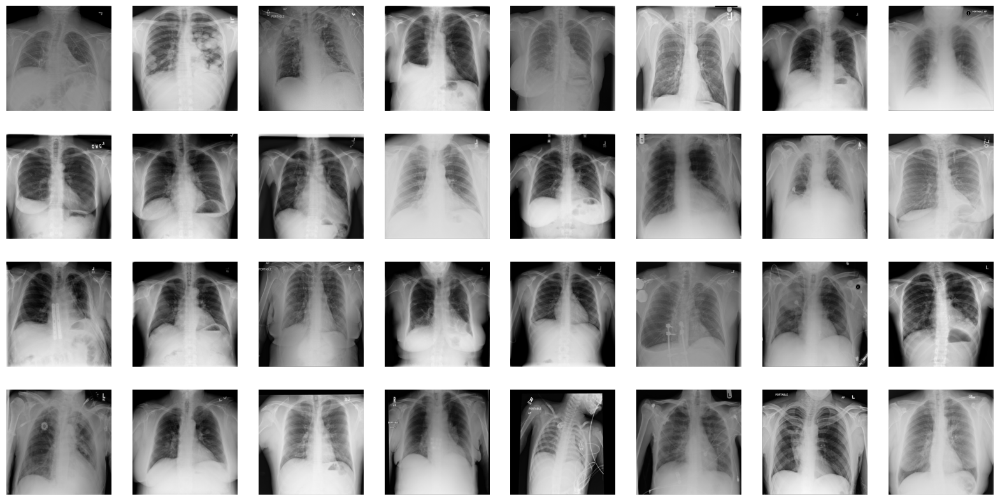

In [ ]:
plt.style.use('default')
fig=plt.figure(figsize=(20, 10))
columns = 8; rows = 4
for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    draw(parsed[not_normal['patientId'].loc[i]])

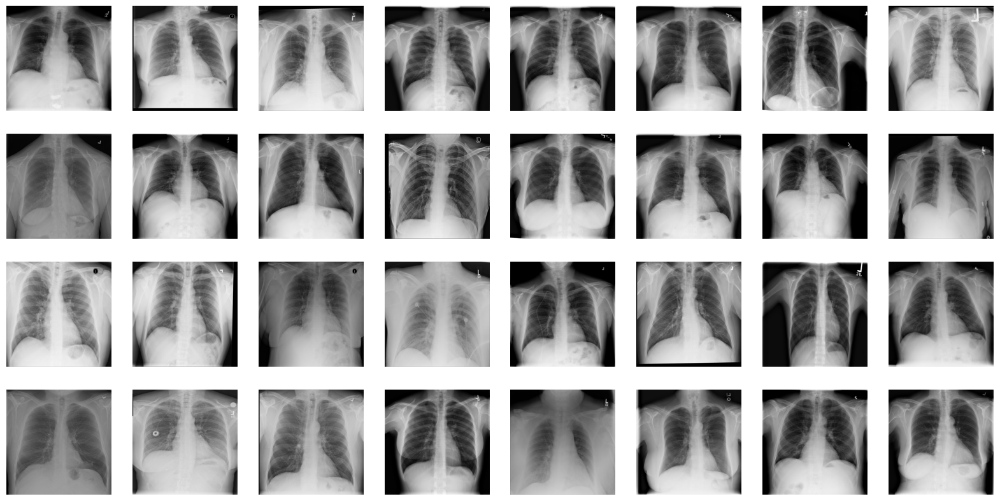

In [ ]:
plt.style.use('default')
fig=plt.figure(figsize=(20, 10))
columns = 8; rows = 4
for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    draw(parsed[normal['patientId'].loc[i]])

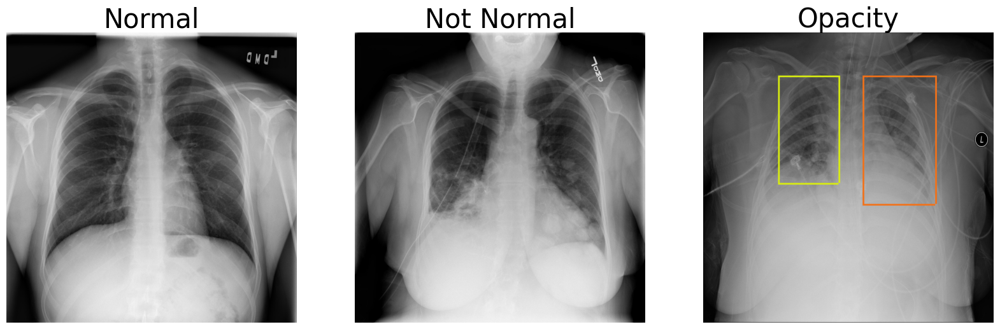

In [ ]:
fig=plt.figure(figsize=(20, 10))
columns = 3; rows = 1
fig.add_subplot(rows, columns, 1).set_title("Normal", fontsize=30)
draw(parsed[normal['patientId'].unique()[0]])
fig.add_subplot(rows, columns, 2).set_title("Not Normal", fontsize=30)
# ax2.set_title("Not Normal", fontsize=30)
draw(parsed[not_normal['patientId'].unique()[0]])
fig.add_subplot(rows, columns, 3).set_title("Opacity", fontsize=30)
# ax3.set_title("Opacity", fontsize=30)
draw(parsed[opacity['patientId'].unique()[0]])

In [ ]:
count_labels_per_patient.reset_index().groupby('class').count()

,patientId
class,
1,23286
2,3266
3,119
4,13


In [ ]:
# Patients with 4 Labels
count_labels_per_patient.sort_values('class', ascending=False).head()

,class
patientId,
76f71a93-8105-4c79-a010-0cfa86f0061a,4
1bf08f3b-a273-4f51-bafa-b55ada2c23b5,4
0ab261f9-4eb5-42ab-a9a5-e918904d6356,4
0e03c2d7-9cea-4dc7-8e91-794a8b3ff58d,4
1c44e0a4-4612-438f-9a83-8d5bf919cb67,4


In [ ]:
detailed_class_info.loc[detailed_class_info['patientId'] == '7d674c82-5501-4730-92c5-d241fd6911e7']

,patientId,class
12251,7d674c82-5501-4730-92c5-d241fd6911e7,Lung Opacity
12252,7d674c82-5501-4730-92c5-d241fd6911e7,Lung Opacity
12253,7d674c82-5501-4730-92c5-d241fd6911e7,Lung Opacity
12254,7d674c82-5501-4730-92c5-d241fd6911e7,Lung Opacity


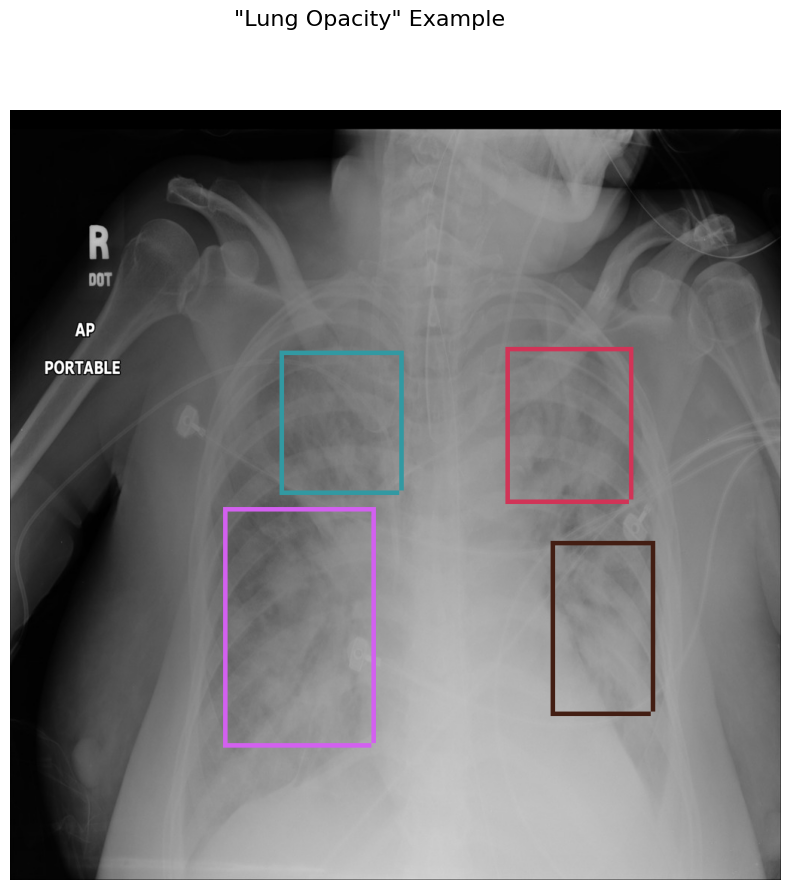

In [ ]:
fig=plt.figure(figsize=(20, 10))
plt.suptitle('"Lung Opacity" Example', fontsize=16)
draw(parsed['7d674c82-5501-4730-92c5-d241fd6911e7'])

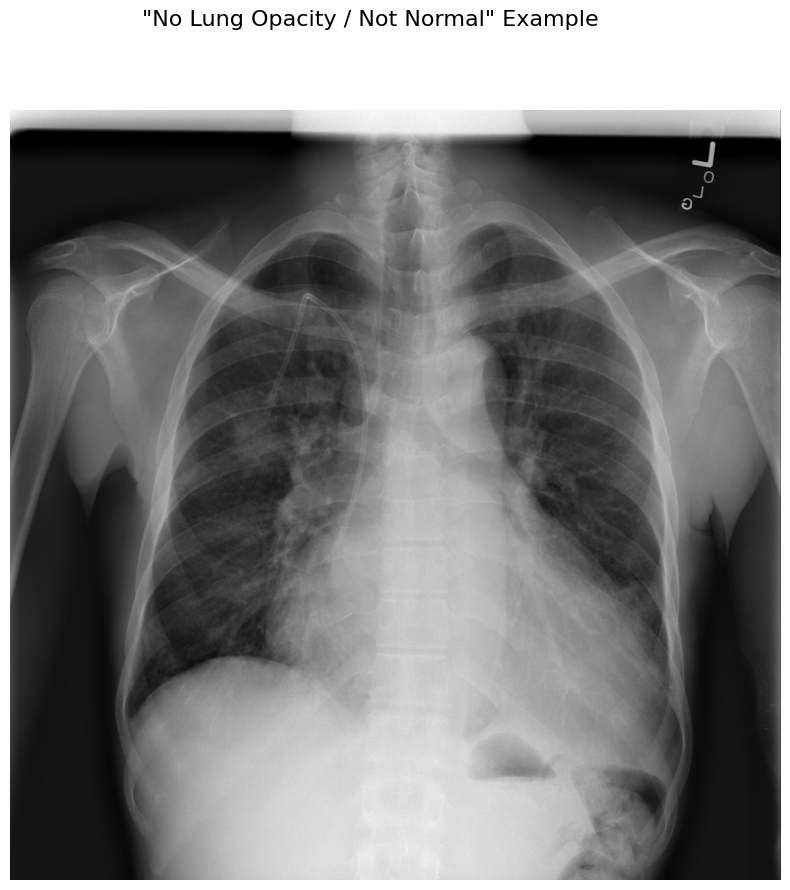

In [ ]:
not_normal = detailed_class_info.loc[detailed_class_info['class'] == 'No Lung Opacity / Not Normal']
not_normal_example = not_normal['patientId']
fig=plt.figure(figsize=(20, 10))
plt.suptitle('"No Lung Opacity / Not Normal" Example', fontsize=16)
draw(parsed['019e035e-2f82-4c66-a198-57422a27925f'])

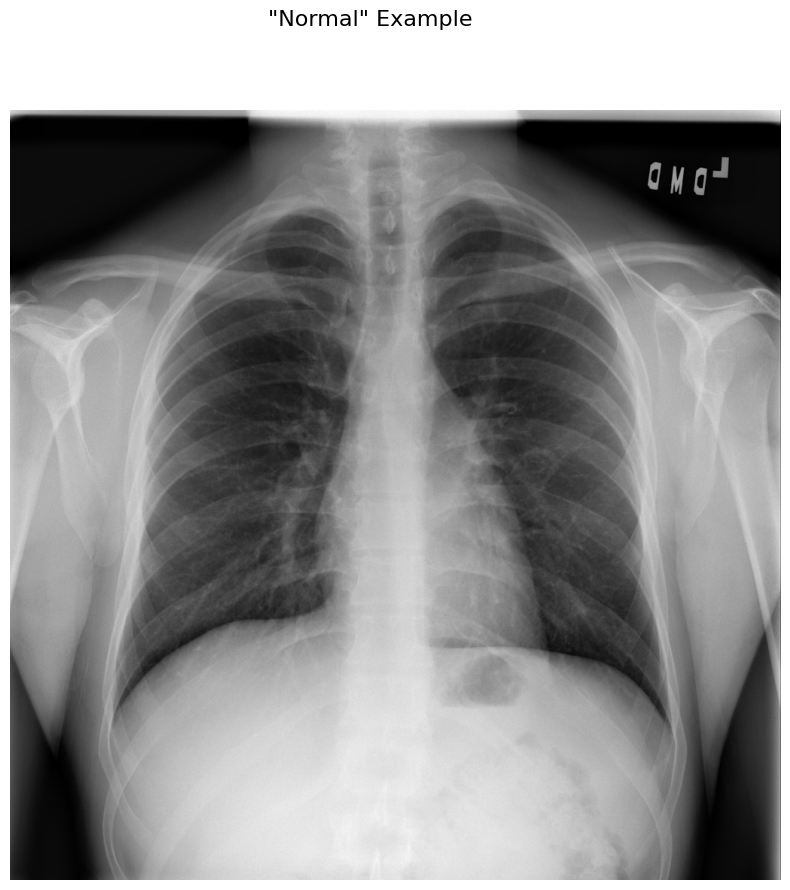

In [ ]:
fig=plt.figure(figsize=(20, 10))
plt.suptitle('"Normal" Example', fontsize=16)
draw(parsed['003d8fa0-6bf1-40ed-b54c-ac657f8495c5'])

# Pre-processing

In [ ]:
# 폐렴 증상이 여러부위가 있으므로 patientId에 중복이 있음, id 중복제거 df

temp = train_labels.drop_duplicates(['patientId'])

In [ ]:
# dcm 파일을 jpg로 변환

for files in image_list:

    d = pydicom.read_file(files)

    plt.imsave('./jpg/' + files.split('/')[2][:-4] + ".jpg",d.pixel_array, cmap=plt.cm.bone)

In [ ]:
shutil.copytree('./chest_jpg', './drive/My Drive/torch_project/medi/chest_jpg')

'./drive/My Drive/torch_project/medi/chest_jpg'

In [ ]:
# 랜덤으로 train 0.7 val 0.2 test 0.1로 나누기
DATA_PATH = './drive/My Drive/torch_project/medi/chexnet/chest_jpg/'
image_list = glob.glob(os.path.join(DATA_PATH, '*.jpg'))
indices = np.arange(0, len(image_list))
np.random.shuffle(indices)
train_list = []
val_list = []
test_list = []
for i, number in enumerate(indices) :
  if i <= int(len(indices)*0.7) :
    train_list.append(image_list[number])
  elif i <= int(len(indices)*0.7)+int(len(indices)*0.2) :
    val_list.append(image_list[number])
  else :
    test_list.append(image_list[number])

In [ ]:
# Script to prepare combined dataset
# Class 0: Normal
# Class 1: Pneumonia

OUTPUT_DIR='./'

def create_list (df, path_list, split):

    l = []
    for f in path_list :
      id = f.split('/')[2][:-4]
      if df[df['patientId']==id]['Target'].values == 0:
        l.append((f, 0))
      else :
        l.append((f, 1))

    with open(os.path.join(OUTPUT_DIR, '%s.txt'%split), 'w') as f:
        for item in l:
            f.write("%s %d\n" % item)

create_list(temp, train_list, 'train')
create_list(temp, val_list,'val')
create_list(temp, test_list,'test')

# CheXNet

1. 121개의 층으로 구성된 2D CNN

2. 224 * 224 이미지를 벡터화

3. Class Activation Mapping (GRAD-CAM) heatmap을 활용 출력 결과 확인 가능

4. FC를 sigmoid를 적용하여 단일 출력

5. Adam optimizer와 16개의 미니 배치, 0.001 lr 적용

In [ ]:
# model 

class DenseNet121(nn.Module):
    """Model modified.
    The architecture of our model is the same as standard DenseNet121
    except the classifier layer which has an additional sigmoid function.
    """
    def __init__(self, out_size):
        super(DenseNet121, self).__init__()
        self.densenet121 = torchvision.models.densenet121(pretrained=True)
        num_ftrs = self.densenet121.classifier.in_features
        self.densenet121.classifier = nn.Sequential(
            nn.Linear(num_ftrs, out_size),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.densenet121(x)
        return x
    

class Pneumonida_Model(DenseNet121):
    """
    Modified DenseNet network with 2 classes
    """
    def __init__(self):
        NUM_CLASSES =2
        super(Pneumonida_Model, self).__init__(NUM_CLASSES)


class CheXNet(DenseNet121):
    """
    Modified DenseNet network with 14 classes
    """
    def __init__(self):
        super(CheXNet, self).__init__(14)

In [ ]:
# dataset

class ChestXrayDataSetTest(Dataset):
    def __init__(self, image_list_file, transform=None):
        """
        Create the Data Loader.
        Since class 2 (Pneumonia) has limited data, dataset size will be accordingly at train time.
        Code is written in generic form to assume last class as the rare class
        Args:
            image_list_file: path to the file containing images
                with corresponding labels.
            transform: optional transform to be applied on a sample.
        """
        self.NUM_CLASSES = 2

        # Set of images for each class
        image_names = []

        with open(image_list_file, "r") as f:
            for line in f:
                items = line.split()
                image_name = items[0]
                label = int(items[1])
                image_names.append((image_name, label))

        self.image_names = image_names
        self.transform = transform

    def __getitem__(self, index):
        """
        Args:
            index: the index of item
        Returns:
            image and its labels
        """
        def __one_hot_encode(l):
            v = [0] * self.NUM_CLASSES
            v[l] = 1
            return v

        image_name, label = self.image_names[index]
        label = __one_hot_encode(label)

        image = Image.open(image_name).convert('RGB')
        if self.transform is not None:
            image = self.transform(image)
        return image, torch.FloatTensor(label)

    def __len__(self):
        return len(self.image_names)


class ChestXrayDataSet(Dataset):
    def __init__(self, image_list_file, transform=None):
        """
        Create the Data Loader.
        Since class 2 (Pneumonia) has limited data, dataset size will be accordingly at train time.
        Code is written in generic form to assume last class as the rare class
        Args:
            image_list_file: path to the file containing images
                with corresponding labels.
            transform: optional transform to be applied on a sample.
        """
        self.NUM_CLASSES = 2

        # Set of images for each class
        image_names = [[] for _ in range(self.NUM_CLASSES)]

        with open(image_list_file, "r") as f:
            for line in f:
                items = line.split()
                image_name = items[0]
                label = int(items[1])
                image_names[label].append(image_name)

        self.image_names = image_names
        self.transform = transform

        label_dist = [len(cnames) for cnames in image_names]

        # Number of images of each class desired
        self.num_pne = int(label_dist[-1])

        # factor의 기능을 모르겠음
        pne_factor = 10.0
        self.num_normal = int(self.num_pne * pne_factor)
        self.total = self.num_pne + self.num_normal
        self.loss_weight_minus = torch.FloatTensor([self.num_normal, self.num_pne]).unsqueeze(0).cuda() / self.total
        self.loss_weight_plus = 1.0 - self.loss_weight_minus

        # print (self.loss_weight_plus, self.loss_weight_minus)


        self.partitions = [self.num_pne,
                            self.num_pne + self.num_normal]

        assert len(self.partitions) == self.NUM_CLASSES

    def __getitem__(self, index):
        """
        Args:
            index: the index of item
        Returns:
            image and its labels
        """

        def __one_hot_encode(l):
            v = [0] * self.NUM_CLASSES
            v[l] = 1
            return v

        image_name = None
        # print (index, self.partitions, len(self), sum([len(cnames) for cnames in self.image_names]))
        if index < self.partitions[0]:
            # Return a Pneumonia image
            data_idx = index
            image_name = self.image_names[self.NUM_CLASSES - 1][data_idx]
            label = __one_hot_encode(self.NUM_CLASSES - 1)
        else:
            # Return normal image
            for l in range(1, self.NUM_CLASSES):
                if index < self.partitions[l]:
                    class_idx = l - 1
                    label = __one_hot_encode(class_idx)
                    # Return a random image
                    image_name = random.choice(self.image_names[class_idx])
                    break

        assert image_name is not None

        image = Image.open(image_name).convert('RGB')
        if self.transform is not None:
            image = self.transform(image)
        return image, torch.FloatTensor(label)

    def __len__(self):
        return self.partitions[-1]

    def loss(self, output, target):
        """
        Binary weighted cross-entropy loss for each class
        """
        weight_plus = torch.autograd.Variable(self.loss_weight_plus.repeat(1, target.size(0)).view(-1, self.loss_weight_plus.size(1)).cuda())
        weight_neg = torch.autograd.Variable(self.loss_weight_minus.repeat(1, target.size(0)).view(-1, self.loss_weight_minus.size(1)).cuda())

        loss = output
        pmask = (target >= 0.5).data
        nmask = (target < 0.5).data
        
        epsilon = 1e-15
        loss[pmask] = (loss[pmask] + epsilon).log() * weight_plus[pmask]
        loss[nmask] = (1-loss[nmask] + epsilon).log() * weight_plus[nmask]
        loss = -loss.sum()
        return loss

In [ ]:
# # transfer -> 훈련 환경이 달라 오류가 발생하므로 사용하지 않음

# import sys
# import torch
# pneumonida_model_trained_checkpoint = './drive/My Drive/torch_project/medi/chexnet/Pneumonida_model.pth.tar'
# chexnet_model_checkpoint = './drive/My Drive/torch_project/medi/chexnet/chexnet.pth.tar'
# model = Pneumonida_Model()

# def load_weights(checkpoint_pth, state_dict=True):
#     model = torch.load(checkpoint_pth)
    
#     if state_dict:
#         return model['state_dict']
#     else:
#         return model

# def get_top_keys(model, depth=0):
#     return set({w.split('.')[depth] for w in model.keys()})

# chexnet_model = load_weights(chexnet_model_checkpoint)
# template = model.state_dict()

# assert get_top_keys(chexnet_model, depth=2) == set({'features', 'classifier'})
# assert get_top_keys(template, depth=1) == set({'features', 'classifier'})

# # print (chexnet_model.keys())
# # print (template.keys())
# # print (model.state_dict().keys())

# c_keys = {k for k in chexnet_model.keys()}
# t_keys = {'module.' + k for k in template.keys()}

# assert len(c_keys.difference(t_keys)) == 0
# assert len(t_keys.difference(c_keys)) == 0

# # Transfer the feature weights
# for k, w in template.items():
#     chex_key = 'module.' + k

#     if k.split('.')[1] == 'classifier':
#         # Uncomment below to copy trained weights of pneumonia
#         # 6th class is pneumonia in CheXNet => Copy it's weights to pneumonia classes
#         # for c in [1, 2, 3]:
#         #     template[k][c, ...] = chexnet_model[chex_key][6, ...]
#         print ('doing nothing for', k)
#     else:
#         # print (type(template[k]), template[k].size())
#         # print (type(chexnet_model[chex_key]), chexnet_model[chex_key].size())
#         #assert chexnet_model[chex_key].size() == template[k].size()
#         template[k] = chexnet_model[chex_key]

# torch.save(template, pneumonida_model_trained_checkpoint)

In [ ]:
"""
Trainer for training and testing the networks
"""


class Trainer:
    def __init__ (self, local_rank=None, checkpoint=None, combine_pneumonia=False, train=True):
        """
        Trainer for the Pneumonida_Model
        """
        self.distributed = True if local_rank is not None else False
        print ("Distributed training %s" % ('ON' if self.distributed else 'OFF'))
        if self.distributed:
            raise NotImplementedError("Currently distributed training not supported")
            self.device = torch.cuda.device('cuda', local_rank)
        else:
            self.device = torch.cuda.device('cuda')

        # self.net = Pneumonida_Model().to(self.device)
        self.net = Pneumonida_Model().cuda()
        if self.distributed:
            self.net = torch.nn.parallel.DistributedDataParallel(self.net,
                                                            device_ids=[local_rank],
                                                            output_device=local_rank)
  
        # load model
        if checkpoint is not None:
          if train :
            self.load_model(checkpoint)
          else : 
            self.load_model(checkpoint, train=False)

    def train(self, TRAIN_IMAGE_LIST, VAL_IMAGE_LIST, NUM_EPOCHS=10, LR=0.001, BATCH_SIZE=64,
                start_epoch=0, logging=True, save_path=None, freeze_feature_layers=True):
        """
        Train the Pneumonida_Model
        """
        normalize = transforms.Normalize([0.485, 0.456, 0.406],
                                     [0.229, 0.224, 0.225])

        train_dataset = ChestXrayDataSet(image_list_file=TRAIN_IMAGE_LIST,
                                        transform=transforms.Compose([
                                            transforms.Resize(256),
                                            transforms.TenCrop(224),
                                            transforms.Lambda
                                            (lambda crops: torch.stack([transforms.ToTensor()(crop) for crop in crops])),
                                            transforms.Lambda
                                            (lambda crops: torch.stack([normalize(crop) for crop in crops]))
                                        ]))
        if self.distributed:
            sampler = DistributedSampler(train_dataset)
            train_loader = DataLoader(dataset=train_dataset, batch_size=BATCH_SIZE,
                                    shuffle=False, num_workers=8, pin_memory=True,
                                    sampler=sampler)
        else:
            train_loader = DataLoader(dataset=train_dataset, batch_size=BATCH_SIZE,
                                    shuffle=True, num_workers=8, pin_memory=True)

        val_dataset = ChestXrayDataSet(image_list_file=VAL_IMAGE_LIST,
                                        transform=transforms.Compose([
                                            transforms.Resize(256),
                                            transforms.TenCrop(224),
                                            transforms.Lambda
                                            (lambda crops: torch.stack([transforms.ToTensor()(crop) for crop in crops])),
                                            transforms.Lambda
                                            (lambda crops: torch.stack([normalize(crop) for crop in crops]))
                                        ]))
        if self.distributed:
            sampler = DistributedSampler(val_dataset)
            val_loader = DataLoader(dataset=val_dataset, batch_size=BATCH_SIZE,
                                    shuffle=False, num_workers=8, pin_memory=True,
                                    sampler=sampler)
        else:
            val_loader = DataLoader(dataset=val_dataset, batch_size=BATCH_SIZE,
                                    shuffle=True, num_workers=8, pin_memory=True)

        # Freeze heads and create optimizer
        if freeze_feature_layers:
            print ("Freezing feature layers")
            for param in self.net.densenet121.features.parameters():
                param.requires_grad = False

        # optimizer = optim.SGD(filter(lambda p: p.requires_grad, self.net.parameters()),
        #                 lr=LR, momentum=0.9)
        optimizer = optim.Adam(filter(lambda p: p.requires_grad, self.net.parameters()), lr=LR)


        for epoch in range(start_epoch, NUM_EPOCHS):
            # switch to train mode
            self.net.train()
            tot_loss = 0.0
            for i, (inputs, target) in tqdm(enumerate(train_loader), total=len(train_dataset)/BATCH_SIZE):
                # inputs = inputs.to(self.device)
                # target = target.to(self.device)
                inputs = inputs.cuda()
                target = target.cuda()

                # Shape of input == [BATCH_SIZE, NUM_CROPS=19, CHANNELS=3, HEIGHT=224, WIDTH=244]
                bs, n_crops, c, h, w = inputs.size()
                inputs = inputs.view(-1, c, h, w)
                inputs = torch.autograd.Variable(inputs.view(-1, c, h, w))
                target = torch.autograd.Variable(target)
                preds = self.net(inputs).view(bs, n_crops, -1).mean(dim=1)

                # loss = torch.sum(torch.abs(preds - target) ** 2)    
                loss = train_dataset.loss(preds, target)  
                # exit()          
                tot_loss += float(loss.data)

                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

            tot_loss /= len(train_dataset)

            # Clear cache
            torch.cuda.empty_cache()
            
            # Running on validation set
            self.net.eval()
            val_loss = 0.0
            for i, (inputs, target) in tqdm(enumerate(val_loader), total=len(val_dataset)/BATCH_SIZE):
                # inputs = inputs.to(self.device)
                # target = target.to(self.device)
                inputs = inputs.cuda()
                target = target.cuda()

                # Shape of input == [BATCH_SIZE, NUM_CROPS=19, CHANNELS=3, HEIGHT=224, WIDTH=244]
                bs, n_crops, c, h, w = inputs.size()
                inputs = inputs.view(-1, c, h, w)
                inputs = torch.autograd.Variable(inputs.view(-1, c, h, w), volatile=True)
                target = torch.autograd.Variable(target, volatile=True)

                preds = self.net(inputs).view(bs, n_crops, -1).mean(1)
                # loss = torch.sum(torch.abs(preds - target) ** 2)
                loss = val_dataset.loss(preds, target) 
                
                val_loss += float(loss.data)

            val_loss /= len(val_dataset)

            # Clear cache
            torch.cuda.empty_cache()

            # logging statistics
            timestamp = str(datetime.datetime.now()).split('.')[0]
            log = json.dumps({
                'timestamp': timestamp,
                'epoch': epoch+1,
                'train_loss': float('%.5f' % tot_loss),
                'val_loss': float('%.5f' % val_loss),
                'lr': float('%.6f' % LR)
            })
            if logging:
                print (log)

            log_file = os.path.join(save_path, 'train.log')
            if log_file is not None:
                with open(log_file, 'a') as f:
                    f.write("{}\n".format(log))

            model_path = os.path.join(save_path, 'epoch_%d.pth'%(epoch+1))
            self.save_model(model_path)
            
        print ('Finished Training')

    def predict(self, TEST_IMAGE_LIST, BATCH_SIZE=32):
        """
        Predict the task labels corresponding to the input images
        """
        normalize = transforms.Normalize([0.485, 0.456, 0.406],
                                     [0.229, 0.224, 0.225])

        test_dataset = ChestXrayDataSetTest(image_list_file=TEST_IMAGE_LIST,
                                        transform=transforms.Compose([
                                            transforms.Resize(256),
                                            transforms.TenCrop(224),
                                            transforms.Lambda
                                            (lambda crops: torch.stack([transforms.ToTensor()(crop) for crop in crops])),
                                            transforms.Lambda
                                            (lambda crops: torch.stack([normalize(crop) for crop in crops]))
                                        ]))
        if self.distributed:
            sampler = DistributedSampler(test_dataset)
            test_loader = DataLoader(dataset=test_dataset, batch_size=BATCH_SIZE,
                                shuffle=False, num_workers=8, pin_memory=True,
                                sampler=sampler)
        else:
            test_loader = DataLoader(dataset=test_dataset, batch_size=BATCH_SIZE,
                                shuffle=True, num_workers=8, pin_memory=True)

        # initialize the ground truth and output tensor
        gt = torch.FloatTensor().cuda()
        pred = torch.FloatTensor().cuda()

        # switch to evaluate mode
        self.net.eval()

        for i, (inputs, target) in tqdm(enumerate(test_loader), total=len(test_loader)):
            # inputs = inputs.to(self.device)
            # target = target.to(self.device)
            inputs = inputs.cuda()
            target = target.cuda()
            gt = torch.cat((gt, target), 0)

            # Shape of input == [BATCH_SIZE, NUM_CROPS=19, CHANNELS=3, HEIGHT=224, WIDTH=244]
            bs, n_crops, c, h, w = inputs.size()
            inputs = torch.autograd.Variable(inputs.view(-1, c, h, w), volatile=True)

            # Pass through the network and take average prediction from all the crops
            output = self.net(inputs)
            output_mean = output.view(bs, n_crops, -1).mean(1)
            pred = torch.cat((pred, output_mean.data), 0)
        gt = gt.cpu().numpy()
        pred = pred.cpu().numpy()

        return gt, pred

    def evaluate(self, TEST_IMAGE_LIST, BATCH_SIZE=32, cm_path='cm', roc_path='roc'):
        """
        Evaluate on the test set plotting confusion matrix and roc curves
        """
        gt, pred = self.predict(TEST_IMAGE_LIST, BATCH_SIZE=4)
        print (pred)

        # Compute ROC scores
        labels = ['Normal', 'Pneumonia']
        self.compute_AUC_scores(gt, pred, labels)

        # Plot ROC scores
        self.plot_ROC_curve(gt, pred, labels, roc_path)

        # Treat the max. output as prediction. 
        # Plot Confusion Matrix
        gt = gt.argmax(axis=1)
        pred = pred.argmax(axis=1)
        self.plot_confusion_matrix(gt, pred, labels, cm_path)

    def F1(self, TEST_IMAGE_LIST, BATCH_SIZE=4):
        """
        Evaluate on multiple test sets and compute F1 scores
        """
        # f = open(out_file, 'w')
        # for test_file in glob.glob(os.path.join(TEST_DIR, '*.txt')):
        #     print(test_file)
        
        gt, pred = self.predict(TEST_IMAGE_LIST, BATCH_SIZE)
        # Treat the max. output as prediction. 
        gt = gt.argmax(axis=1)
        pred = pred.argmax(axis=1)
        f1 = f1_score(gt, pred, average='macro')
        print('test set F1 score :', f1)

    def plot_confusion_matrix(self, y_true, y_pred, labels, cm_path):
        norm_cm = confusion_matrix(y_true, y_pred, normalize='true')
        norm_df_cm = pd.DataFrame(norm_cm, index=labels, columns=labels)
        plt.figure(figsize = (10,7))
        sn.heatmap(norm_df_cm, annot=True, fmt='.2f', square=True, cmap=plt.cm.Blues)
        plt.xlabel("Predicted")
        plt.ylabel("Ground Truth")
        matplotlib.rcParams.update({'font.size': 14})
        plt.savefig('%s_norm.png' % cm_path, pad_inches = 0, bbox_inches='tight')
        
        cm = confusion_matrix(y_true, y_pred)
        # Finding the annotations
        cm = cm.tolist()
        norm_cm = norm_cm.tolist()
        annot = [
            [("%d (%.2f)" % (c, nc)) for c, nc in zip(r, nr)]
            for r, nr in zip(cm, norm_cm)
        ]
        plt.figure(figsize = (10,7))
        sn.heatmap(norm_df_cm, annot=annot, fmt='', cbar=False, square=True, cmap=plt.cm.Blues)
        plt.xlabel("Predicted")
        plt.ylabel("Ground Truth")
        matplotlib.rcParams.update({'font.size': 14})
        plt.savefig('%s.png' % cm_path, pad_inches = 0, bbox_inches='tight')
        print (cm)

        accuracy = np.sum(y_true == y_pred) / len(y_true)
        print ("Accuracy: %.5f" % accuracy)

    def compute_AUC_scores(self, y_true, y_pred, labels):
        """
        Computes the Area Under the Curve (AUC) from prediction scores
        y_true.shape  = [n_samples, n_classes]
        y_preds.shape = [n_samples, n_classes]
        labels.shape  = [n_classes]
        """
        AUROC_avg = roc_auc_score(y_true, y_pred)
        print('The average AUROC is {AUROC_avg:.4f}'.format(AUROC_avg=AUROC_avg))
        for y, pred, label in zip(y_true.transpose(), y_pred.transpose(), labels):
            print('The AUROC of {0:} is {1:.4f}'.format(label, roc_auc_score(y, pred)))

    def plot_ROC_curve(self, y_true, y_pred, labels, roc_path): 
        """
        Plots the ROC curve from prediction scores
        y_true.shape  = [n_samples, n_classes]
        y_preds.shape = [n_samples, n_classes]
        labels.shape  = [n_classes]
        """
        n_classes = len(labels)
        # Compute ROC curve and ROC area for each class
        fpr = dict()
        tpr = dict()
        roc_auc = dict()
        for y, pred, label in zip(y_true.transpose(), y_pred.transpose(), labels):
            fpr[label], tpr[label], _ = roc_curve(y, pred)
            roc_auc[label] = auc(fpr[label], tpr[label])

        # First aggregate all false positive rates
        all_fpr = np.unique(np.concatenate([fpr[label] for label in labels]))

        # Then interpolate all ROC curves at this points
        mean_tpr = np.zeros_like(all_fpr)
        for label in labels:
            mean_tpr += interp(all_fpr, fpr[label], tpr[label])

        # Finally average it and compute AUC
        mean_tpr /= n_classes

        # Compute micro-average ROC curve and ROC area
        fpr["micro"], tpr["micro"], _ = roc_curve(y_true.ravel(), y_pred.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

        fpr["macro"] = all_fpr
        tpr["macro"] = mean_tpr
        roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

        # Plot all ROC curves
        plt.figure()
        lw = 2
        plt.plot(fpr["micro"], tpr["micro"],
                label='micro-average ROC curve (area = {0:0.3f})'
                    ''.format(roc_auc["micro"]),
                color='deeppink', linestyle=':', linewidth=2)

        plt.plot(fpr["macro"], tpr["macro"],
                label='macro-average ROC curve (area = {0:0.3f})'
                    ''.format(roc_auc["macro"]),
                color='navy', linestyle=':', linewidth=2)

        if len(labels) == 4:
            colors = ['green', 'cornflowerblue', 'darkorange', 'darkred']
        else:
            colors = ['green', 'cornflowerblue', 'darkred']
        for label, color in zip(labels, cycle(colors)):
            plt.plot(fpr[label], tpr[label], color=color, lw=lw,
                    label='ROC curve of {0} (area = {1:0.3f})'
                    ''.format(label, roc_auc[label]))

        plt.plot([0, 1], [0, 1], 'k--', lw=lw)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC curve')
        plt.legend(loc="lower right")
        matplotlib.rcParams.update({'font.size': 14})
        plt.savefig('%s.png' % roc_path, pad_inches = 0, bbox_inches='tight')

    def save_model(self, checkpoint_path, model=None):
        if model is None: model = self.net
        torch.save(model.state_dict(), checkpoint_path)
    
    def load_model(self, checkpoint_path, model=None, train=True):
        print ("Loading model from %s" % checkpoint_path)
        if model is None: model = self.net
        if train :
          checkpoint = torch.load(checkpoint_path)
          state_dict = checkpoint['state_dict']
          new_state_dict = OrderedDict()

          for k, v in state_dict.items():
            if 'module' not in k:
                k = 'module.'+k
            else:
                k = k.replace('features.module.', 'module.features.')
            new_state_dict[k]=v
          model.load_state_dict(new_state_dict, strict=False)
        else :
          model.load_state_dict(torch.load(checkpoint_path))

In [ ]:
# training 

TRAIN_IMAGE_LIST = './train.txt'
VAL_IMAGE_LIST = './val.txt'
TEST_IMAGE_LIST = './test.txt'
BATCH_SIZE= 8
LR = 1e-4
start_epoch=0
save_path='./drive/My Drive/torch_project/medi/checkpoint'
freeze = True

PRE_TRAINED_PATH='./drive/My Drive/torch_project/medi/CheXNet_model.pth.tar'
trainer = Trainer(checkpoint=PRE_TRAINED_PATH, True)
trainer.train(TRAIN_IMAGE_LIST, VAL_IMAGE_LIST, BATCH_SIZE=BATCH_SIZE, NUM_EPOCHS=300, LR=LR,
                    start_epoch=start_epoch, save_path=save_path, freeze_feature_layers=freeze)

In [ ]:
# fine-tuning

BATCH_SIZE= 4
best_model_path='./drive/My Drive/torch_project/medi/chexnet/best_model'
freeze = False

PRE_TRAINED_PATH='./drive/My Drive/torch_project/medi/chexnet/checkpoint/epoch_25.pth'
trainer = Trainer(checkpoint=PRE_TRAINED_PATH, train=False)
trainer.train(TRAIN_IMAGE_LIST, VAL_IMAGE_LIST, BATCH_SIZE=BATCH_SIZE, NUM_EPOCHS=5, LR=LR,
                    start_epoch=start_epoch, save_path=best_model_path, freeze_feature_layers=freeze)

Distributed training OFF
Loading model from ./drive/My Drive/torch_project/medi/chexnet/checkpoint/epoch_25.pth


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
  0%|          | 0/11610.5 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
11611it [35:24,  5.46it/s]                             
  0%|          | 0/3267.0 [00:00<?, ?it/s

{"timestamp": "2021-08-17 05:19:52", "epoch": 1, "train_loss": 0.23815, "val_loss": 0.24736, "lr": 0.0001}


11611it [35:22,  5.47it/s]                             
100%|██████████| 3267/3267.0 [06:49<00:00,  7.97it/s]


{"timestamp": "2021-08-17 06:02:06", "epoch": 2, "train_loss": 0.2194, "val_loss": 0.22478, "lr": 0.0001}


11611it [35:24,  5.47it/s]                             
100%|██████████| 3267/3267.0 [06:49<00:00,  7.97it/s]


{"timestamp": "2021-08-17 06:44:21", "epoch": 3, "train_loss": 0.20566, "val_loss": 0.21711, "lr": 0.0001}


11611it [35:25,  5.46it/s]                             
100%|██████████| 3267/3267.0 [06:49<00:00,  7.98it/s]


{"timestamp": "2021-08-17 07:26:38", "epoch": 4, "train_loss": 0.18936, "val_loss": 0.21835, "lr": 0.0001}


11611it [35:24,  5.47it/s]                             
100%|██████████| 3267/3267.0 [06:48<00:00,  7.99it/s]


{"timestamp": "2021-08-17 08:08:52", "epoch": 5, "train_loss": 0.17087, "val_loss": 0.24374, "lr": 0.0001}
Finished Training


Distributed training OFF
Loading model from ./drive/My Drive/torch_project/medi/chexnet/best_model/epoch_5.pth


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
100%|██████████| 668/668 [01:23<00:00,  7.95it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:339: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead


[[9.8033792e-01 1.9769123e-02]
 [4.7276124e-01 5.2687037e-01]
 [9.9966830e-01 3.3138183e-04]
 ...
 [9.9357903e-01 6.4507821e-03]
 [9.9869126e-01 1.2915920e-03]
 [5.2942812e-01 4.7046629e-01]]
The average AUROC is 0.8599
The AUROC of Normal is 0.8599
The AUROC of Pneumonia is 0.8599
[[1984, 83], [373, 229]]
Accuracy: 0.82915


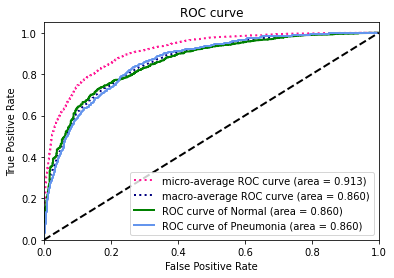

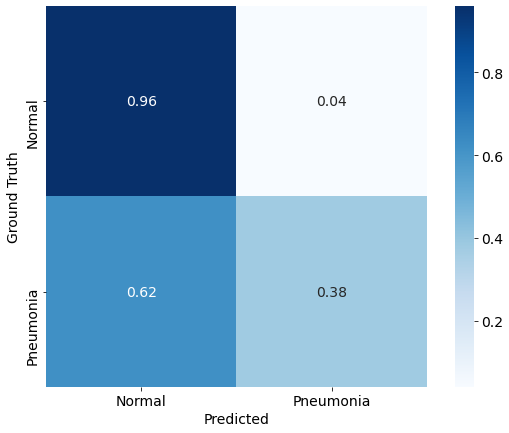

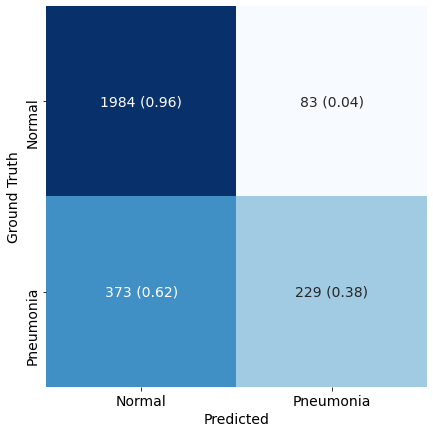

In [ ]:
# evaluate

trainer = Trainer(checkpoint=PRE_TRAINED_PATH, train=False)
trainer.evaluate(TEST_IMAGE_LIST)

In [ ]:
# F1 Score

trainer = Trainer(checkpoint=PRE_TRAINED_PATH, train=False)
trainer.F1(TEST_IMAGE_LIST=TEST_IMAGE_LIST)

Distributed training OFF
Loading model from ./drive/My Drive/torch_project/medi/chexnet/best_model/epoch_5.pth


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
100%|██████████| 668/668 [01:23<00:00,  7.97it/s]

test set F1 score : 0.6990099754274477


# Visualization

In [ ]:
class RISE(nn.Module):
    def __init__(self, model, input_size, gpu_batch=100):
        super(RISE, self).__init__()
        self.model = model
        self.input_size = input_size
        self.gpu_batch = gpu_batch

    def generate_masks(self, N, s, p1, savepath='masks.npy'):
        cell_size = np.ceil(np.array(self.input_size) / s)
        up_size = (s + 1) * cell_size

        grid = np.random.rand(N, s, s) < p1
        grid = grid.astype('float32')

        self.masks = np.empty((N, *self.input_size))

        for i in tqdm(range(N), desc='Generating filters'):
            # Random shifts
            x = np.random.randint(0, cell_size[0])
            y = np.random.randint(0, cell_size[1])
            # Linear upsampling and cropping
            self.masks[i, :, :] = resize(grid[i], up_size, order=1, mode='reflect',
                                         anti_aliasing=False)[x:x + self.input_size[0], y:y + self.input_size[1]]
        self.masks = self.masks.reshape(-1, 1, *self.input_size)
        np.save(savepath, self.masks)
        self.masks = torch.from_numpy(self.masks).float()
        self.masks = self.masks.cuda()
        self.N = N
        self.p1 = p1

    def load_masks(self, filepath, p1):
        self.masks = np.load(filepath)
        self.masks = torch.from_numpy(self.masks).float().cuda()
        self.N = self.masks.shape[0]
        self.p1 = p1

    def forward(self, x):
        N = self.N
        _, _, H, W = x.size()
        # Apply array of filters to the image
        stack = torch.mul(self.masks, x.data)

        # p = nn.Softmax(dim=1)(model(stack)) processed in batches
        p = []
        for i in range(0, N, self.gpu_batch):
#             print("Forward check for mask number ",i)
            p.append(self.model(torch.autograd.Variable(stack[i:min(i + self.gpu_batch, N)])))
        p = torch.cat(p)
        # Number of classes
        CL = p.size(1)
        sal = torch.matmul(p.data.transpose(0, 1), self.masks.view(N, H * W))
        sal = sal.view((CL, H, W))
        sal = sal / N / self.p1
        return sal
    
    
class RISEBatch(RISE):
    def forward(self, x):
        # Apply array of filters to the image
        N = self.N
        B, C, H, W = x.size()
        stack = torch.mul(self.masks.view(N, 1, H, W), x.data.view(B * C, H, W))
        stack = stack.view(B * N, C, H, W)
        stack = stack

        #p = nn.Softmax(dim=1)(model(stack)) in batches
        p = []
        for i in range(0, N*B, self.gpu_batch):
            p.append(self.model(stack[i:min(i + self.gpu_batch, N*B)]))
        p = torch.cat(p)
        CL = p.size(1)
        p = p.view(N, B, CL)
        sal = torch.matmul(p.permute(1, 2, 0), self.masks.view(N, H * W))
        sal = sal.view(B, CL, H, W)
        return sal

In [ ]:
# Dummy class to store arguments
class Dummy():
    pass

# Function that opens image from disk, normalizes it and converts to tensor
read_tensor = transforms.Compose([
    lambda x: Image.open(x),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                          std=[0.229, 0.224, 0.225]),
    lambda x: torch.unsqueeze(x, 0)
])


# Plots image from tensor
def tensor_imshow(inp, title=None, **kwargs):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    # Mean and std for ImageNet
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp, **kwargs)
    if title is not None:
        plt.title(title)

        # Plots image from tensor
def tensor_save(inp, title=None, **kwargs):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    # Mean and std for ImageNet
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.savefig(**kwargs)
#     if title is not None:
#         plt.title(title)

# Given label number returns class name
def get_class_name(c):
    labels = np.loadtxt('synset_words.txt', str, delimiter='\t')
    return ' '.join(labels[c].split(',')[0].split()[1:])


# Image preprocessing function
preprocess = transforms.Compose([
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                # Normalization for ImageNet
                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225]),
            ])


# Sampler for pytorch loader. Given range r loader will only
# return dataset[r] instead of whole dataset.
class RangeSampler(Sampler):
    def __init__(self, r):
        self.r = r

    def __iter__(self):
        return iter(self.r)

    def __len__(self):
        return len(self.r)

In [ ]:
cudnn.benchmark = True

def visualize(model,IMAGE_DIR_LIST,visualize_dir,Pne_DataLoader):
    
    dataset = Pne_DataLoader(IMAGE_DIR_LIST=IMAGE_DIR_LIST, transform=preprocess)
    data_loader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=False, pin_memory=True)
    gpu_batch_size = 10

    model = model.eval()
    model = model.cuda()

    for p in model.parameters():
        p.requires_grad = False
        
    explainer = RISE(model, (224,224), gpu_batch_size)
    
    # Generate masks for RISE or use the saved ones.
    maskspath = 'masks.npy'
    generate_new = True

    if generate_new or not os.path.isfile(maskspath):
        explainer.generate_masks(N=1000, s=8, p1=0.1, savepath=maskspath)
    else:
        explainer.load_masks(maskspath, p1=0.1)
    
    def explain_all(data_loader, explainer):
        # Get all predicted labels first
        target = np.empty(len(data_loader), np.int)
        for i, (img, _) in enumerate(tqdm(data_loader, total=len(data_loader), desc='Predicting labels')):
            p, c = torch.max(model(torch.autograd.Variable(img.cuda())), dim=1)
            target[i] = c[0]

        # Get saliency maps for all images in val loader
        explanations = np.empty((len(data_loader), 224,224))
        for i, (img, _) in enumerate(tqdm(data_loader, total=len(data_loader), desc='Explaining images')):
            saliency_maps = explainer(torch.autograd.Variable(img.cuda()))
            explanations[i] = saliency_maps[target[i]].cpu().numpy()
        return explanations

    explanations = explain_all(data_loader, explainer)
    
    if not os.path.exists(visualize_dir):
        os.makedirs(visualize_dir)
    for i, (img, img_name) in enumerate(tqdm(data_loader, total=len(data_loader), desc='Generating visualizations')):
        img_name = os.path.splitext(img_name[0])[0]
        p, c = torch.max(model(torch.autograd.Variable(img.cuda())), dim=1)
        p, c = p.data[0], c.data[0]

        plt.figure(figsize=(10, 5))
        plt.subplot(121)
        plt.axis('off')
        tensor_imshow(img[0])
        plt.subplot(122)
        plt.axis('off')
        tensor_imshow(img[0])
        sal = explanations[i]
        plt.imshow(sal, cmap='jet', alpha=0.25)
        plt.savefig(visualize_dir+"/"+img_name+"_visualization.png")

In [ ]:
# test_list 20 samples

test_xray_list= ['./drive/My Drive/torch_project/medi/chexnet/chest_jpg/71043372-1241-4da3-a470-e0e7585f668c.jpg',
 './drive/My Drive/torch_project/medi/chexnet/chest_jpg/be16ff6b-cb15-424f-91ed-ff6612110961.jpg',
 './drive/My Drive/torch_project/medi/chexnet/chest_jpg/3038262f-ca56-436a-bdfe-7a547026fcb0.jpg',
 './drive/My Drive/torch_project/medi/chexnet/chest_jpg/7ae8181a-854b-413b-8574-8c7236fdb64b.jpg',
 './drive/My Drive/torch_project/medi/chexnet/chest_jpg/a31fd48e-8dd7-4a31-a197-ed1d67ec98cf.jpg',
 './drive/My Drive/torch_project/medi/chexnet/chest_jpg/05207a0f-a1bc-46f8-8acb-aa72197e52af.jpg',
 './drive/My Drive/torch_project/medi/chexnet/chest_jpg/548ee990-ae0c-4307-87f3-f92912c7951c.jpg',
 './drive/My Drive/torch_project/medi/chexnet/chest_jpg/b827ba3b-f514-48c8-a317-b84adc9e0b31.jpg',
 './drive/My Drive/torch_project/medi/chexnet/chest_jpg/a85953be-7d0b-4bbc-920a-44a79e8a90e6.jpg',
 './drive/My Drive/torch_project/medi/chexnet/chest_jpg/66b315be-43f0-4476-90d3-8c148b6e18bd.jpg',
 './drive/My Drive/torch_project/medi/chexnet/chest_jpg/2ed57b2d-a30f-4728-a2f8-76bb825a813c.jpg',
 './drive/My Drive/torch_project/medi/chexnet/chest_jpg/5b5af702-dd0a-4b1f-9c97-1963d498c42e.jpg',
 './drive/My Drive/torch_project/medi/chexnet/chest_jpg/061ccabd-b0cf-4238-a053-28a1960c1923.jpg',
 './drive/My Drive/torch_project/medi/chexnet/chest_jpg/b86e6759-681b-4846-a51a-9f6ec523d633.jpg',
 './drive/My Drive/torch_project/medi/chexnet/chest_jpg/d27599f4-d62b-4f38-b453-9ae87dea771e.jpg',
 './drive/My Drive/torch_project/medi/chexnet/chest_jpg/85b4d16c-52e9-4dea-8af3-c6b6c246e316.jpg',
 './drive/My Drive/torch_project/medi/chexnet/chest_jpg/eb82b8a8-8710-4364-bb9b-8dcfe0edf813.jpg',
 './drive/My Drive/torch_project/medi/chexnet/chest_jpg/a29d2f91-e135-4810-b896-ee443666df54.jpg',
 './drive/My Drive/torch_project/medi/chexnet/chest_jpg/6439bc8e-a134-4f5c-a801-e67379549322.jpg',
 './drive/My Drive/torch_project/medi/chexnet/chest_jpg/02589621-9494-4801-99a8-a4e89c1b525d.jpg']

PRE_TRAINED_PATH='./drive/My Drive/torch_project/medi/chexnet/best_model/epoch_5.pth'
visualize_dir = './rise'

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
100%|██████████| 5/5 [00:01<00:00,  3.43it/s]


+------------------------------------------+---------+-----------+
|                   Name                   | Normal  | Pneumonia |
+==========================================+=========+===========+
| 71043372-1241-4da3-a470-e0e7585f668c.jpg | 99.7 %  |   0.3 %   |
+------------------------------------------+---------+-----------+
| be16ff6b-cb15-424f-91ed-ff6612110961.jpg | 99.3 %  |   0.7 %   |
+------------------------------------------+---------+-----------+
| 3038262f-ca56-436a-bdfe-7a547026fcb0.jpg |  5.9 %  |  94.1 %   |
+------------------------------------------+---------+-----------+
| 7ae8181a-854b-413b-8574-8c7236fdb64b.jpg | 99.6 %  |   0.4 %   |
+------------------------------------------+---------+-----------+
| a31fd48e-8dd7-4a31-a197-ed1d67ec98cf.jpg | 93.3 %  |   6.6 %   |
+------------------------------------------+---------+-----------+
| 05207a0f-a1bc-46f8-8acb-aa72197e52af.jpg | 99.4 %  |   0.6 %   |
+------------------------------------------+---------+--------

Generating visualizations: 100%|██████████| 20/20 [00:08<00:00,  2.49it/s]


Visualizations generated at ./rise


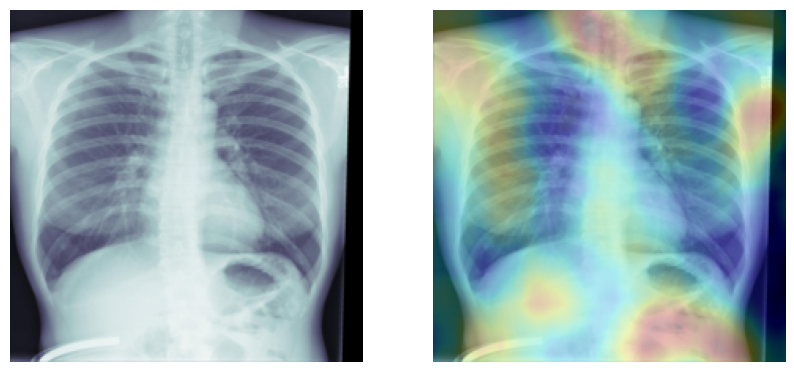

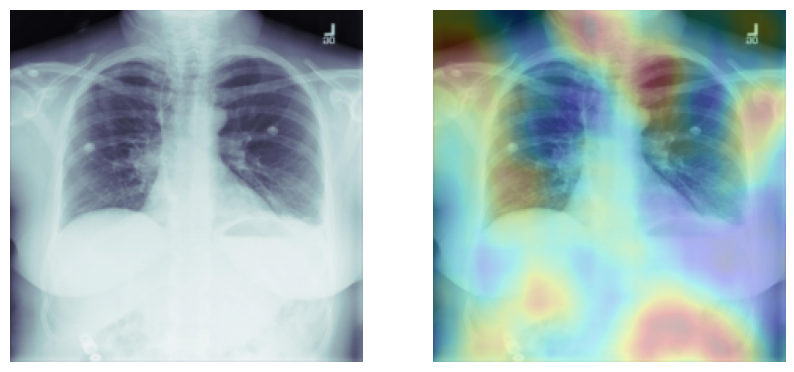

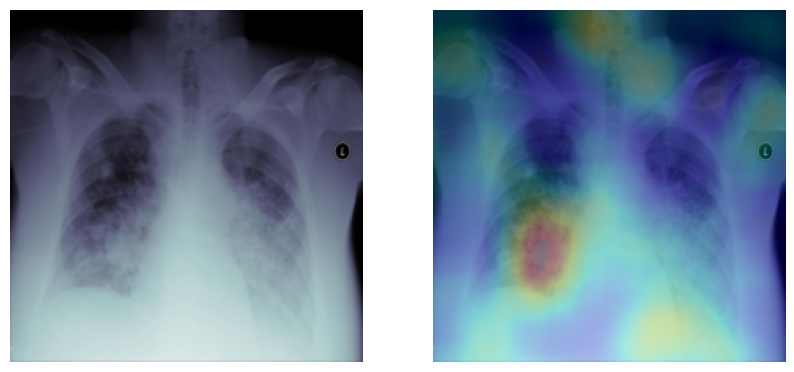

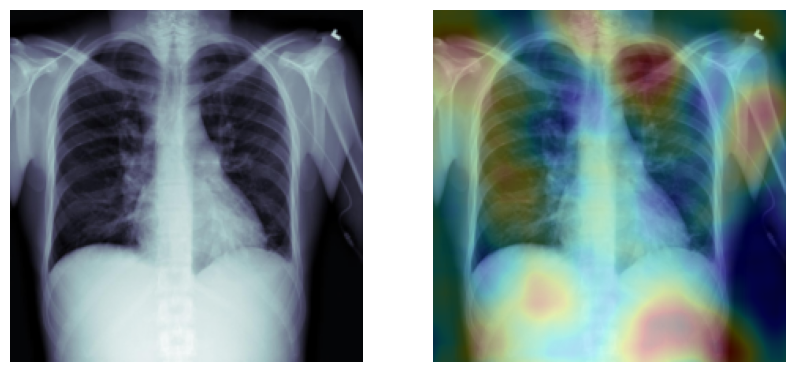

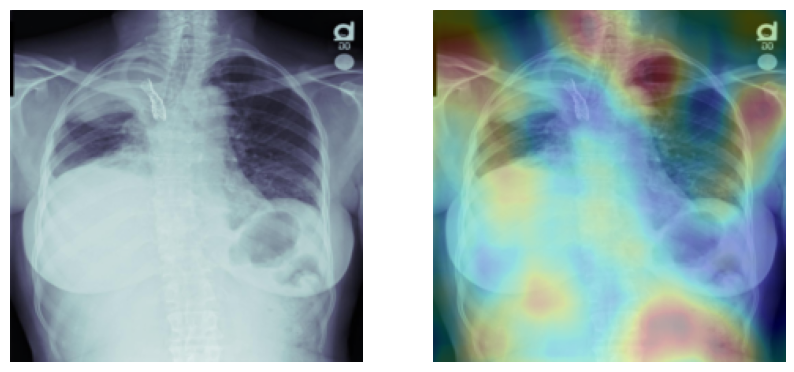

...

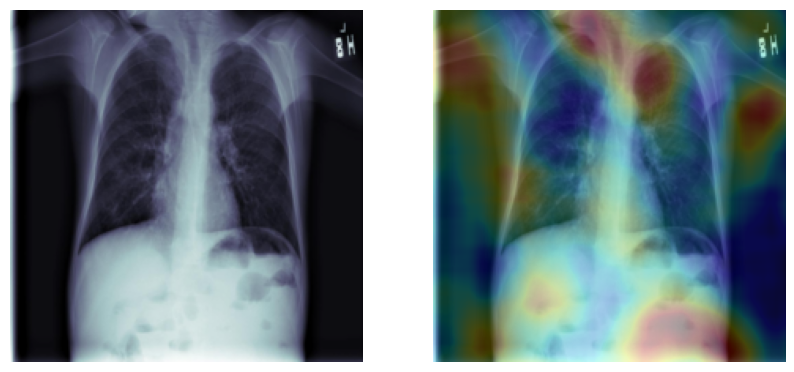

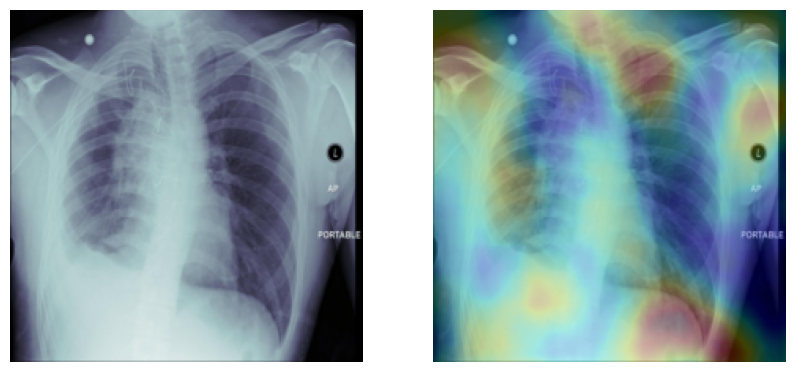

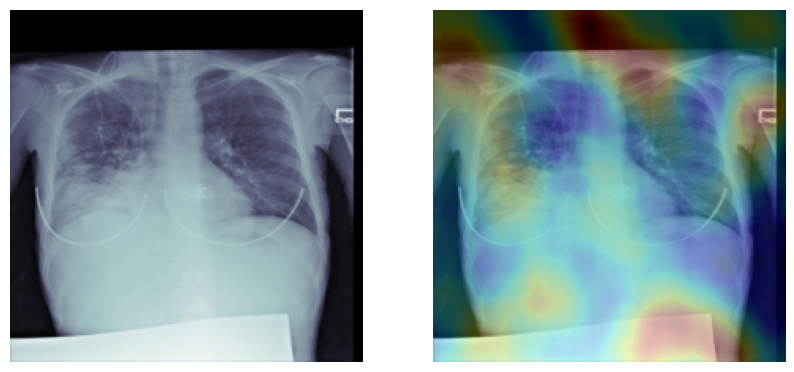

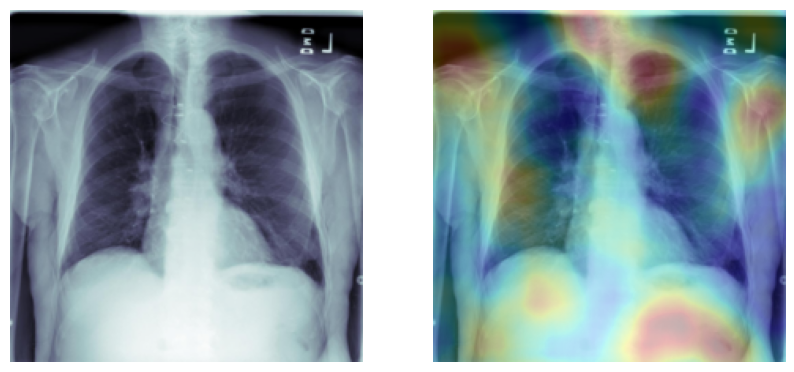

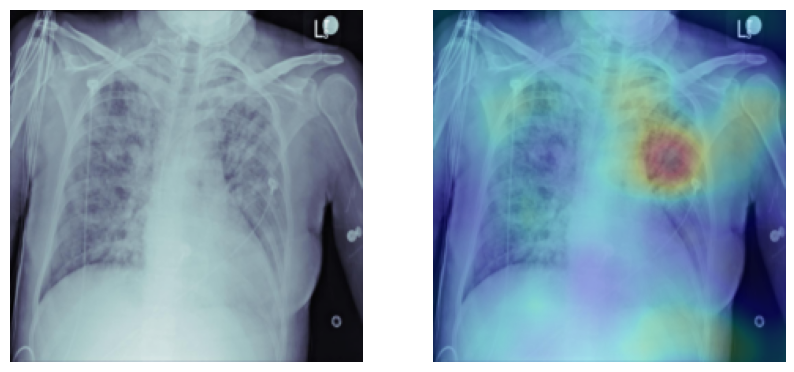

In [ ]:
class Pne_DataLoader(Dataset):
    """
    Read images and corresponding labels.
    """
    def __init__(self, IMAGE_DIR_LIST, transform=None):
        """
        Args:
            image_dir: path to image directory.
            transform: optional transform to be applied on a sample.
        """
        self.image_names = IMAGE_DIR_LIST
        self.transform = transform

    def __getitem__(self, index):
        """
        Args:
            index: the index of item
        Returns:
            image and its name
        """
        image_name = self.image_names[index]
        image = Image.open(image_name).convert('RGB')
        if self.transform is not None:
            image = self.transform(image)
        return image, image_name.split('/')[-1]

    def __len__(self):
        return len(self.image_names)

# Load the model
model = Pneumonida_Model().cuda()
model.load_state_dict(torch.load(PRE_TRAINED_PATH))

# Load the data
normalize = transforms.Normalize([0.485, 0.456, 0.406],
                                  [0.229, 0.224, 0.225])

test_dataset = Pne_DataLoader(IMAGE_DIR_LIST=test_xray_list,
        transform=transforms.Compose([
            transforms.Resize(256),
            transforms.TenCrop(224),
            transforms.Lambda
            (lambda crops: torch.stack([transforms.ToTensor()(crop) for crop in crops])),
            transforms.Lambda
            (lambda crops: torch.stack([normalize(crop) for crop in crops]))
        ])
)
test_loader = DataLoader(dataset=test_dataset, batch_size=4,
                shuffle=False, num_workers=8, pin_memory=True)

# initialize the output tensor
pred = torch.FloatTensor().cuda()
pred_names = []

# switch to evaluate mode
model.eval()

for i, (inputs, names) in tqdm(enumerate(test_loader), total=len(test_loader)):
    inputs = inputs.cuda()

    # Shape of input == [BATCH_SIZE, NUM_CROPS=10, CHANNELS=3, HEIGHT=224, WIDTH=244]
    bs, n_crops, c, h, w = inputs.size()
    inputs = torch.autograd.Variable(inputs.view(-1, c, h, w), volatile=True)

    # Pass through the network and take average prediction from all the crops
    output = model(inputs)
    output_mean = output.view(bs, n_crops, -1).mean(1)
    pred = torch.cat((pred, output_mean.data), 0)
    pred_names += names

pred = pred.cpu().numpy()

assert len(pred) == len(pred_names)

scores = []
for p, n in zip(pred, pred_names):
    p = ["%.1f %%" % (i * 100) for i in p]
    scores.append([n] + p)

header=['Name', 'Normal', 'Pneumonia']
alignment="c"*3

string = tt.to_string(
    scores,
    header=header,
    style=tt.styles.ascii_thin_double,
    padding=(0, 1),
    alignment=alignment
)

print(string)

# RISE Visualization
if visualize_dir:
    visualize(model, test_xray_list, visualize_dir, Pne_DataLoader)
    print("Visualizations generated at "+str(visualize_dir))

In [98]:
for i in test_xray_list :
  id =i.split('/')[7][:-4]
  print("실제 데이터 label :", temp.Target[temp.patientId == id].values)

실제 데이터 label : [0]
실제 데이터 label : [0]
실제 데이터 label : [1]
실제 데이터 label : [0]
실제 데이터 label : [1]
실제 데이터 label : [0]
실제 데이터 label : [0]
실제 데이터 label : [0]
실제 데이터 label : [0]
실제 데이터 label : [0]
실제 데이터 label : [0]
실제 데이터 label : [0]
실제 데이터 label : [0]
실제 데이터 label : [1]
실제 데이터 label : [0]
실제 데이터 label : [0]
실제 데이터 label : [0]
실제 데이터 label : [1]
실제 데이터 label : [0]
실제 데이터 label : [1]


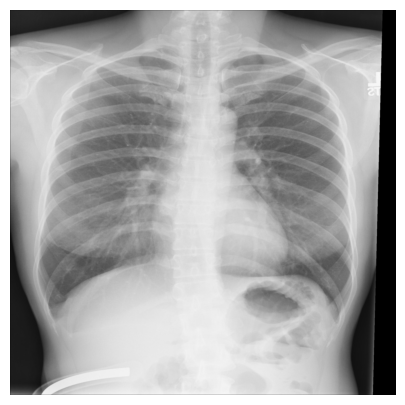

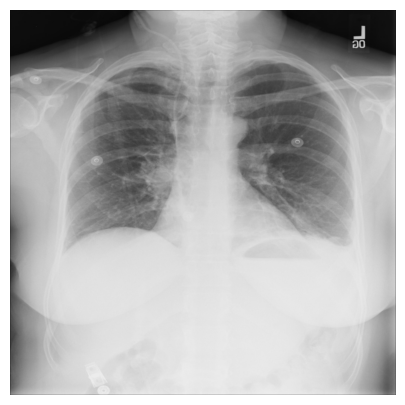

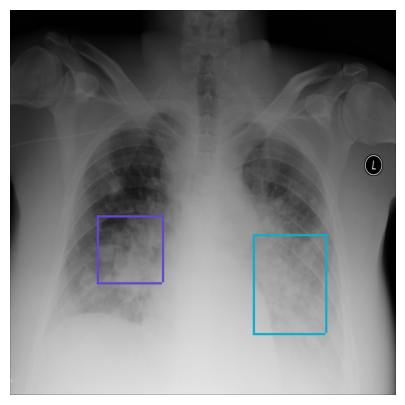

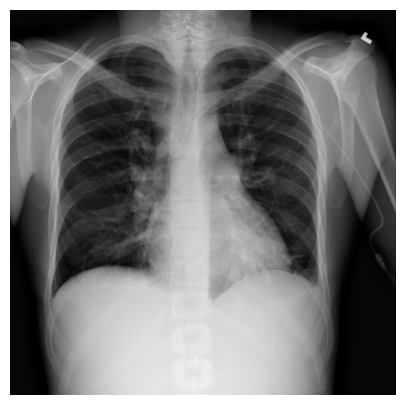

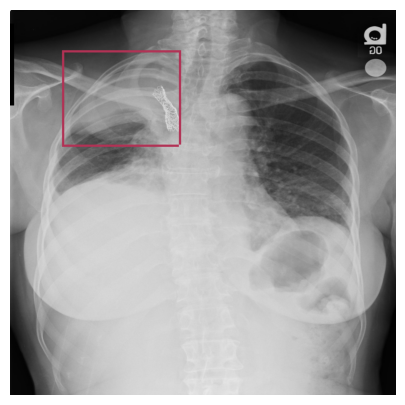

...

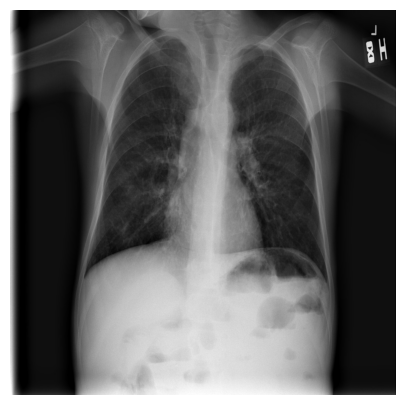

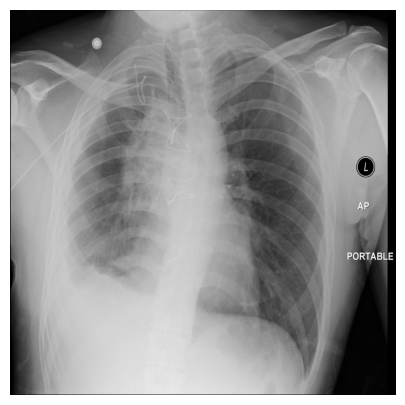

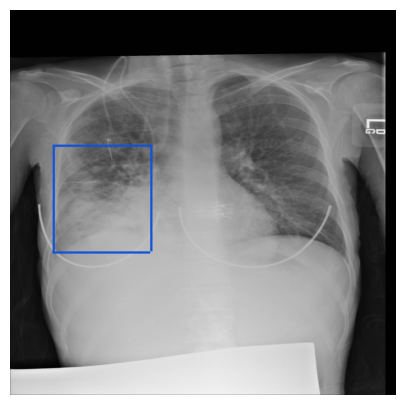

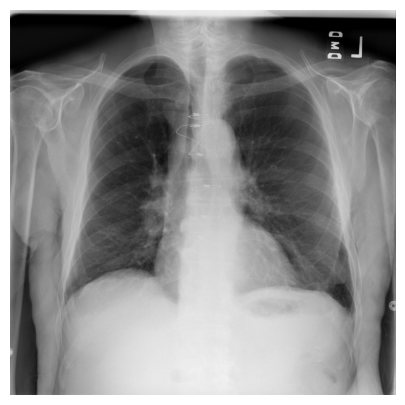

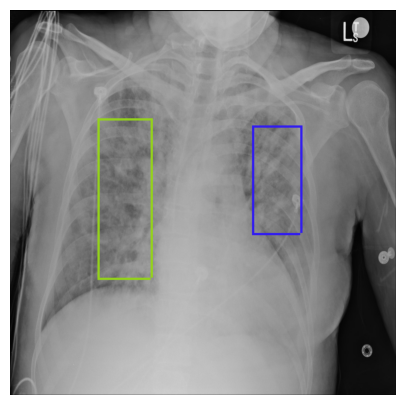

In [160]:
# 실제 데이터 폐렴 감지

plt.style.use('default')
for i, name in enumerate(test_xray_list):
  id = name.split('/')[7][:-4]
  fig=plt.figure(figsize=(10, 5))
  draw(parsed[id])
  plt.show()
